In [565]:
import numpy as np
import pandas as pd

import glob

from functools import reduce
from itertools import combinations

import matplotlib.pyplot as plt
import seaborn as sns

import missingno as msno

import scipy.stats as stats

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
import sklearn.neighbors._base
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base

from missingpy import MissForest
from MissForestExtra import MissForestExtra as mfe

import sys
import re

In [268]:
"""Function to consolidate datasets from different years into a single dataframe with common column names"""

def batch_read(path):
    dfs = [pd.read_sas(filename) for filename in glob.glob(path + "/*.XPT")]
    
    #Select columns common to all dataframes
    common_cols = [dfs[-1].columns]
    for df in dfs:
        cols = np.intersect1d(common_cols, df.columns)
        common_cols = cols
    
    #Organize each dataframe based on common_cols
    dfs_new_cols = []
    for df in dfs:
        dfs_new_cols.append(df[common_cols])
    
    #concatenate dfs
    dfs_concatenated = pd.concat(dfs_new_cols, axis = 0)    
    return dfs_concatenated

In [269]:
"""Let's read in the mental health-depression questionnaire survey across all years (2005-2018)"""
depression_screen = batch_read('/Users/jnl741/Desktop/NHANES/Mental_health')

In [270]:
depression_screen.columns

Index(['DPQ010', 'DPQ020', 'DPQ030', 'DPQ040', 'DPQ050', 'DPQ060', 'DPQ070',
       'DPQ080', 'DPQ090', 'DPQ100', 'SEQN'],
      dtype='object')

In [271]:
"""Rename columns"""

depression_screen_new_cols = {'SEQN':'SEQN',
                                 'DPQ010':'Have little interest in doing things',
                                 'DPQ020':'Feeling down depressed or hopeless',
                                 'DPQ030':'Sleeping issues',
                                 'DPQ040':'Feeling tired or low energy',
                                 'DPQ050':'Poor appetite or overeating',
                                 'DPQ060':'Feeling bad about self',
                                 'DPQ070':'Trouble coencentrating',
                                 'DPQ080':'Moving or speaking too slow or fast',
                                 'DPQ090':'Thought you would be better of dead',
                                 'DPQ100':'Difficulty these problems have caused'}


depression_screen = depression_screen.rename(columns = depression_screen_new_cols)
depression_screen.columns = depression_screen.columns.str.replace(' ','_')

<AxesSubplot:>

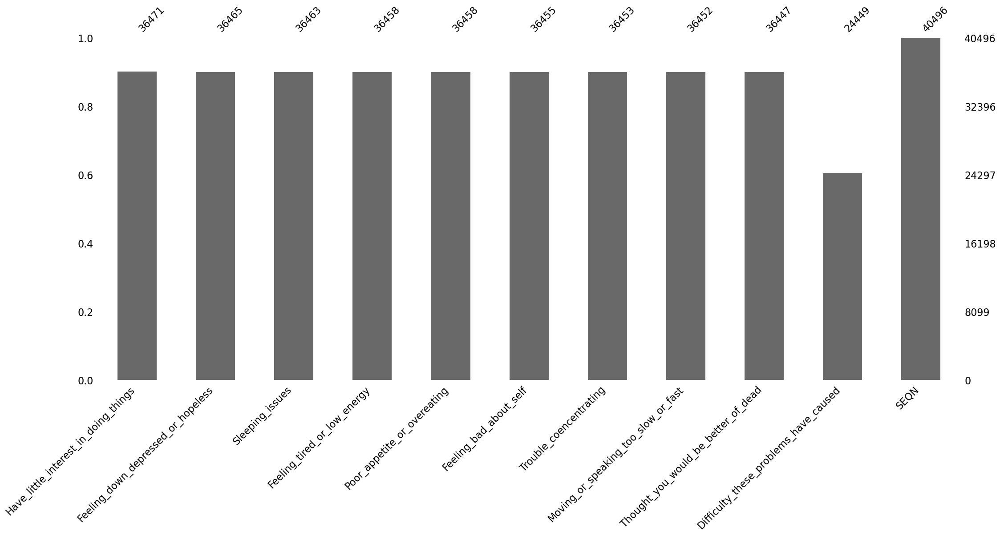

In [273]:
"""Let's evaluate the extent of missing values in the depression screen using the MSNO package"""
msno.bar(depression_screen)


<AxesSubplot:>

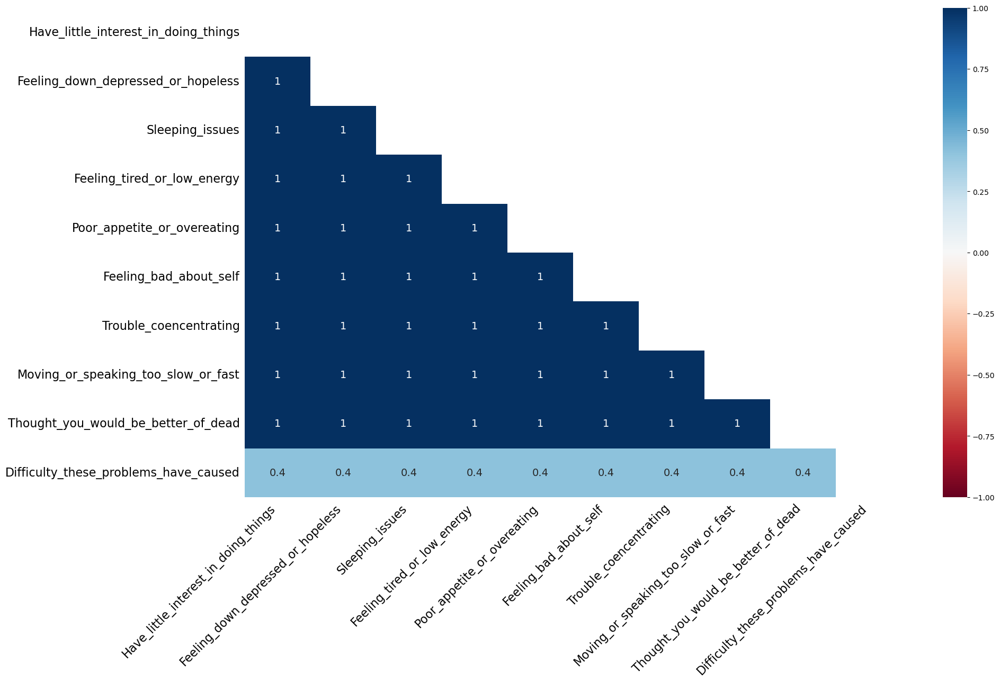

In [274]:
"""Heatmap to display correlations in missing values between columns: 1 means that between two columns, the same
rows have missing values, -1 indicates perfect anticorrelation in missing values. """
msno.heatmap(depression_screen)

In [275]:
"""Drop the 'Difficulty these problems have caused' column, as it is not part of the PHQ-9, the
information it contains is redundant, and about half of the values are missing. 
It appears as though there is perfect correlation (score of 1) between present/absent data 
among the remaining columns, indicating that the same patients have multiple missing values. We will therefore drop 
the rows with missing values."""

depression_screen = depression_screen.drop(labels = 'Difficulty_these_problems_have_caused', axis = 1)


In [276]:
depression_screen.isnull().sum()

Have_little_interest_in_doing_things    4025
Feeling_down_depressed_or_hopeless      4031
Sleeping_issues                         4033
Feeling_tired_or_low_energy             4038
Poor_appetite_or_overeating             4038
Feeling_bad_about_self                  4041
Trouble_coencentrating                  4043
Moving_or_speaking_too_slow_or_fast     4044
Thought_you_would_be_better_of_dead     4049
SEQN                                       0
dtype: int64

In [277]:
"""Lets remove rows containing missing responses to the questionnaire"""
PHQ9_cols = [column for column in depression_screen.columns if column != 'SEQN']
depression_screen[PHQ9_cols] = np.where(depression_screen[PHQ9_cols].isin([7,9]),
                                         np.nan,
                                         depression_screen[PHQ9_cols])
depression_screen = depression_screen.dropna()
depression_screen.shape

(36259, 10)

In [352]:
depression_screen.columns = depression_screen.columns.str.replace(' ','_').str.lower()

In [278]:
"""Let's calculate the PHQ-9 score for each participant. Each question on the questionnaire is scored from 0-3, and 
the overall score is the sum of these individual scores."""

depression_screen['PHQ9_score'] = depression_screen[PHQ9_cols].sum(axis = 1)


In [281]:
"""PHQ-9 scores are broken down into 5 groups ranging from 'Not depressed' to 'Severe' depression."""

def depression_rating(x):
    if x <=4:
        depression_rating = 'Not depressed'
    elif x > 4 and x <= 9:
        depression_rating = 'Mild'
    elif x > 10 and x <= 14:
        depression_rating = 'Moderate'
    elif x > 15 and x <= 19:
        depression_rating = 'Moderately severe'
    else:
        depression_rating = 'Severe'
    
    return depression_rating

depression_screen['depression_rating'] = depression_screen['PHQ9_score'].apply(depression_rating)


In [282]:
depression_screen['depression_rating'].value_counts().reindex(['Not depressed',
                                                              'Mild',
                                                              'Moderate',
                                                              'Moderately severe',
                                                              'Severe'])

Not depressed        27317
Mild                  5774
Moderate              1405
Moderately severe      626
Severe                1137
Name: depression_rating, dtype: int64

In [283]:
"""Demographic data"""

demographics = batch_read('/Users/jnl741/Desktop/NHANES/Demographics')

<AxesSubplot:>

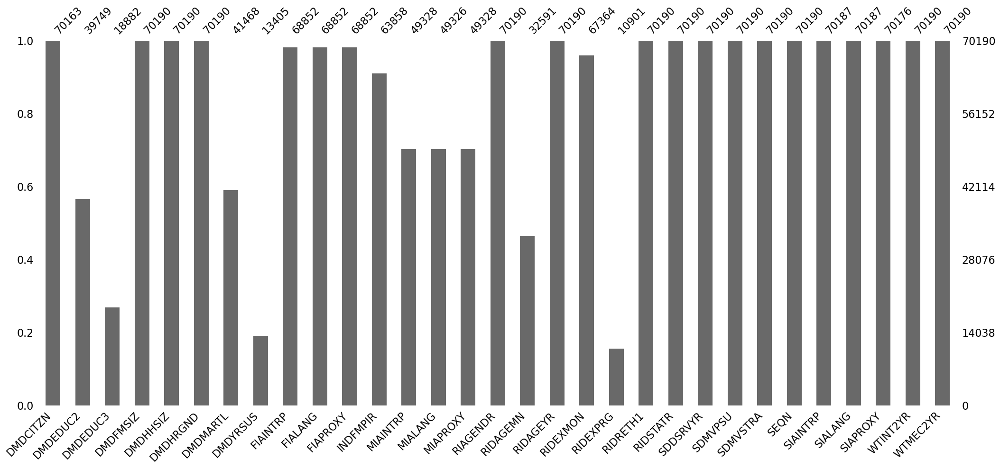

In [284]:
msno.bar(demographics)

In [293]:
demographics_new_cols = {'DMDCITZN':'Citizenship status',
'DMDEDUC2':'Education level, adults',
'DMDEDUC3':'Education level, youth',
'DMDFMSIZ':'Family size',
'DMDHHSIZ':'Household size',
'DMDHRGND':'HH ref person gender',
'DMDMARTL':'Marital status',
'DMDYRSUS':'Length of time in US',
'FIAINTRP':'Interpreter used in family interview',
'FIALANG':'Language of family interview',
'FIAPROXY':'Proxy used in family interview',
'INDFMPIR':'Family poverty to income ratio',
'MIAINTRP':'Interpreter used in MEC interview',
'MIALANG':'Language of MEC Interview',
'MIAPROXY':'Proxy used in MEC interview',
'RIAGENDR':'Gender',
'RIDAGEMN':'Age in months',
'RIDAGEYR':'Age in years',
'RIDEXMON':'Six month time period of exam',
'RIDEXPRG':'Pregnancy status',
'RIDRETH1':'Race/ethnicity',
'RIDSTATR':'Interview/examination status',
'SDDSRVYR':'Data release number',
'SDMVPSU':'Masked variance pseudo-PSU',
'SDMVSTRA':'Masked variance pseudo-stratum',
'SEQN':'SEQN',
'SIAINTRP':'Interpreter used in SP interview',
'SIALANG':'Language of SP interview',
'SIAPROXY':'Proxy used in SP interview',
'WTINT2YR':'Full sample 2 year interview weight',
'WTMEC2YR':'Full sample 2 year MEC exam weight'}


demographics = demographics.rename(columns = demographics_new_cols)
demographics.columns = demographics.columns.str.replace(' ', '_').str.lower()

In [288]:
demographics.columns

Index(['seqn', 'age_in_years', 'gender', 'race/ethnicity'], dtype='object')

In [296]:
biochem_profile = batch_read('/Users/jnl741/Desktop/NHANES/Lab_values/Biochem_profile')

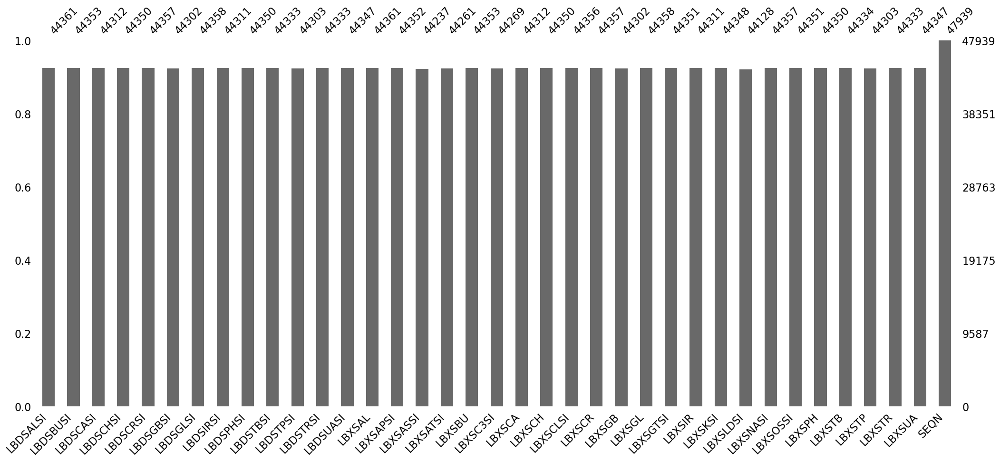

In [298]:
msno.bar(biochem_profile);

In [299]:
biochem_profile_new_cols = {
'SEQN':'SEQN',
"LBXSAL":"Albumin (g/dL)",
"LBDSALSI":"Albumin (g/L)",
"LBXSATSI":"Alanine aminotransferase ALT (U/L)",
"LBXSASSI":"Aspartate aminotransferase AST (U/L)",
"LBXSAPSI":"Alkaline phosphotase (U/L)",
"LBXSBU":"Blood urea nitrogen (mg/dL)",
"LBDSBUSI":"Blood urea nitrogen (mmol/L)",
"LBXSCA":"Total calcium (mg/dL)",
"LBDSCASI":"Total calcium (mmol/L)",
"LBXSCH":"Cholesterol (mg/dL)",
"LBDSCHSI":"Cholesterol (mmol/L)",
"LBXSC3SI":"Bicarbonate (mmol/L)",
"LBXSCR":"Creatinine (mg/dL)",
"LBDSCRSI":"Creatinine (umol/L)",
"LBXSGTSI":"Gamma glutamyl transferase (U/L)",
"LBXSGL":"Glucose (mg/dL)",
"LBDSGLSI":"Glucose (mmol/L)",
"LBXSIR":"Iron (ug/dL)",
"LBDSIRSI":"Iron (umol/L)",
"LBXSLDSI":"Lactate dehydrogenase (U/L)",
"LBXSPH":"Phosphorus (mg/dL)",
"LBDSPHSI":"Phosphorus (mmol/L)",
"LBXSTB":"Total bilirubin (mg/dL)",
"LBDSTBSI":"Bilirubin (umol/L)",
"LBXSTP":"Total protein (g/dL)",
"LBDSTPSI":"Total protein (g/L)",
"LBXSTR":"Triglycerides (mg/dL)",
"LBDSTRSI":"Triglycerides (mmol/L)",
"LBXSUA":"Uric acid (mg/dL)",
"LBDSUASI":"Uric acid (umol/L)",
"LBXSNASI":"Sodium (mmol/L)",
"LBXSKSI":"Potassium (mmol/L)",
"LBXSCLSI":"Chloride (mmol/L)",
"LBXSOSSI":"Osmolality (mmol/Kg)",
"LBXSGB":"Globulin (g/dL)",
"LBDSGBSI":"Globulin (g/L)"
}

biochem_profile = biochem_profile.rename(columns = biochem_profile_new_cols)
biochem_profile.columns = biochem_profile.columns.str.replace(' ','_').str.lower()

In [301]:
biochem_profile = biochem_profile.drop(columns = ['albumin_(g/l)',
                               "cholesterol_(mmol/l)",
                               "total_calcium_(mmol/l)",
                               "creatinine_(umol/l)",
                               'globulin_(g/dl)',
                               "blood_urea_nitrogen_(mg/dl)",
                               'total_calcium_(mg/dl)',
                               'glucose_(mg/dl)',
                               "iron_(umol/l)",
                               'phosphorus_(mg/dl)',
                               'total_bilirubin_(mg/dl)',
                               'total_protein_(g/dl)',
                               'triglycerides_(mg/dl)',
                               "uric_acid_(umol/l)"])


In [302]:
cholesterol_HDL = batch_read('/Users/jnl741/Desktop/NHANES/Lab_values/Cholesterol_HDL')

<AxesSubplot:>

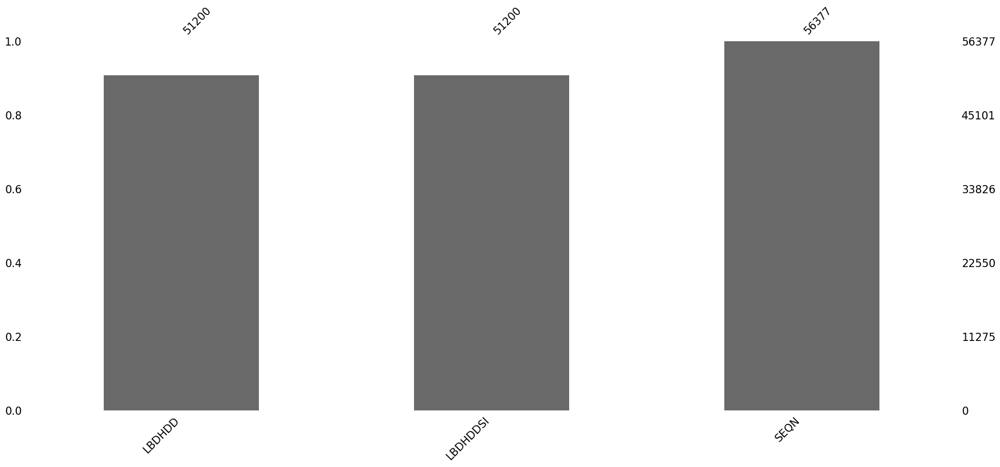

In [303]:
msno.bar(cholesterol_HDL)

In [304]:
cholesterol_HDL_new_cols = {'SEQN':'SEQN',
                            'LBDHDDSI':'Direct HDL-Cholesterol (mmol/L)'}

cholesterol_HDL = cholesterol_HDL.drop(columns = ['LBDHDD'])
cholesterol_HDL = cholesterol_HDL.rename(columns = cholesterol_HDL_new_cols)
cholesterol_HDL.columns = cholesterol_HDL.columns.str.replace(' ','_').str.lower()

In [305]:
cholesterol_LDL = batch_read('/Users/jnl741/Desktop/NHANES/Lab_values/LDL_and_Triglycerides')

In [306]:
cholesterol_LDL.columns

Index(['LBDLDL', 'LBDLDLSI', 'LBDTRSI', 'LBXTR', 'SEQN', 'WTSAF2YR'], dtype='object')

<AxesSubplot:>

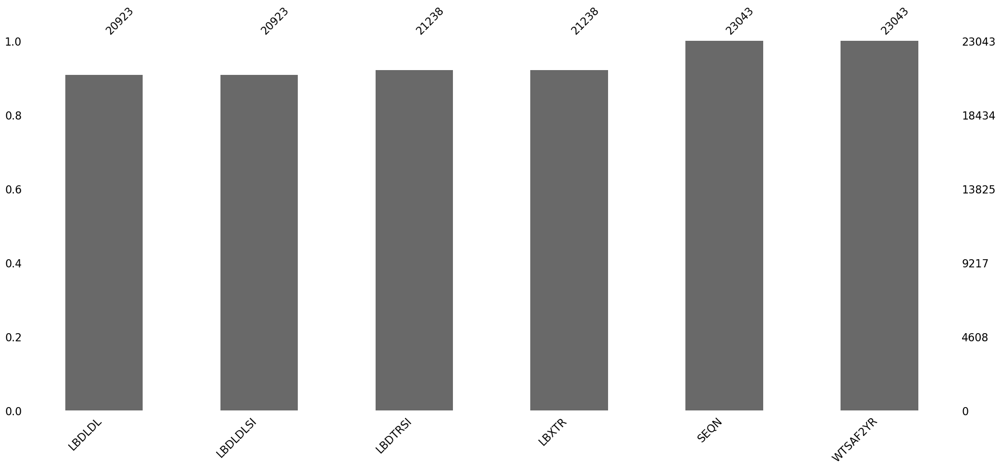

In [307]:
msno.bar(cholesterol_LDL)

In [308]:
cholesterol_LDL_new_cols = {'SEQN':'SEQN',
                       'WTSAF2YR':'Fasting subsample 2 year MEC weight',
                       'LBXTR':'Triglyceride (mg/dL)',
                       'LBDTRSI':'Triglyceride (mmol/L)',
                       'LBDLDLSI':'LDL-cholesterol (mmol/L)',
                       'LBDLDL':'LDL-cholesterol (mg/dL)'}

cholesterol_LDL = cholesterol_LDL.rename(columns = cholesterol_LDL_new_cols)
cholesterol_LDL.columns = cholesterol_LDL.columns.str.replace(' ','_').str.lower()

In [309]:
vitamin_d = batch_read('/Users/jnl741/Desktop/NHANES/Lab_values/Vitamin_D')

In [310]:
vitamin_d.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36673 entries, 0 to 9164
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LBDVD2LC  31099 non-null  float64
 1   LBDVD3LC  31101 non-null  float64
 2   LBDVE3LC  30848 non-null  float64
 3   LBDVIDLC  31098 non-null  float64
 4   LBXVD2MS  31099 non-null  float64
 5   LBXVD3MS  31101 non-null  float64
 6   LBXVE3MS  30848 non-null  float64
 7   LBXVIDMS  31098 non-null  float64
 8   SEQN      36673 non-null  float64
dtypes: float64(9)
memory usage: 2.8 MB


In [311]:
vitamin_d_2015 = pd.read_sas('/Users/jnl741/Desktop/VID_D.XPT')

<AxesSubplot:>

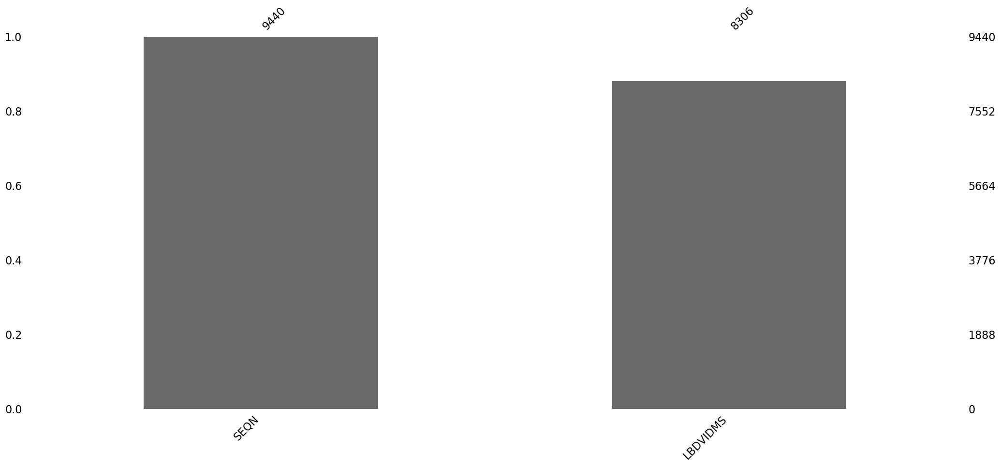

In [312]:
msno.bar(vitamin_d_2015)

In [313]:
vitamin_d_2015 = vitamin_d_2015.rename(columns = {'LBDVIDMS':'LBXVIDMS'})

In [314]:
vitamin_d_master = pd.concat([vitamin_d_2015,vitamin_d])

<AxesSubplot:>

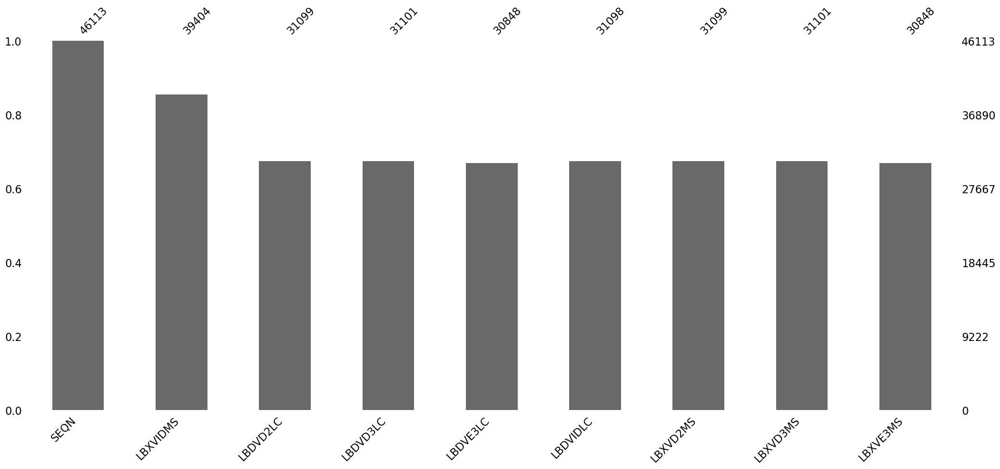

In [315]:
msno.bar(vitamin_d_master)

In [316]:
vitamin_d_master = vitamin_d[["SEQN","LBXVIDMS","LBXVD2MS","LBXVD3MS","LBXVE3MS"]].copy()

vitamin_d_master = vitamin_d_master.rename(columns = {'LBXVIDMS':'Vitamin_d_total_(nmol/L)',
                                  "LBXVD2MS":"Vitamin_D2_(nmol/L)",
                                  "LBXVD3MS":"Vitamin_D3_(nmol/L)",
                                  "LBXVE3MS":"epi-25OHD3_(nmol/L)"})

vitamin_d_master.columns = vitamin_d_master.columns.str.replace(' ','_').str.lower()

In [318]:
"""As the total column is the sum of 25OHD2 and 3 columns, the missing values in the total column should only
exist if one of the others (or both) is null, as well."""

vitamin_d_master[(vitamin_d_master['vitamin_d_total_(nmol/l)'].isnull()) & (vitamin_d_master['vitamin_d2_(nmol/l)'].notnull()) | (vitamin_d_master['vitamin_d3_(nmol/l)'].notnull())]

,seqn,vitamin_d_total_(nmol/l),vitamin_d2_(nmol/l),vitamin_d3_(nmol/l),epi-25ohd3_(nmol/l)
0,41475.0,58.8,1.45,57.3,4.17
1,41476.0,80.9,1.45,79.4,5.52
2,41477.0,81.8,1.45,80.3,2.42
4,41479.0,78.4,1.45,76.9,3.07
7,41482.0,61.9,3.71,58.2,3.10
...,...,...,...,...,...
9160,93698.0,58.2,1.45,56.8,4.87
9161,93699.0,75.2,2.51,72.7,9.38
9162,93700.0,66.2,1.45,64.8,4.15
9163,93701.0,72.2,1.45,70.8,7.13


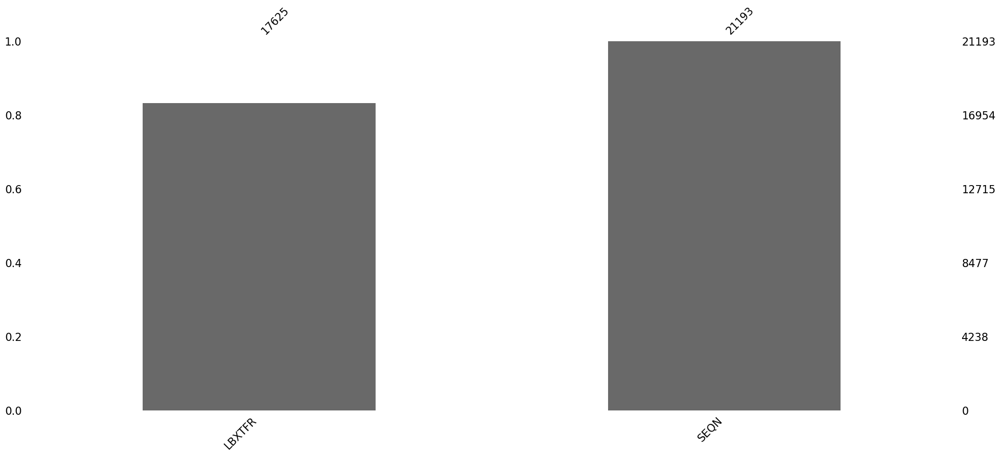

In [320]:
transferrin = batch_read('/Users/jnl741/Desktop/NHANES/Lab_values/Transferrin')
msno.bar(transferrin);

In [321]:
transferrin = transferrin.rename(columns = {'LBXTFR':'Transferrin_receptor_(mg/L)'})
transferrin.columns = transferrin.columns.str.replace(' ','_').str.lower()

<AxesSubplot:>

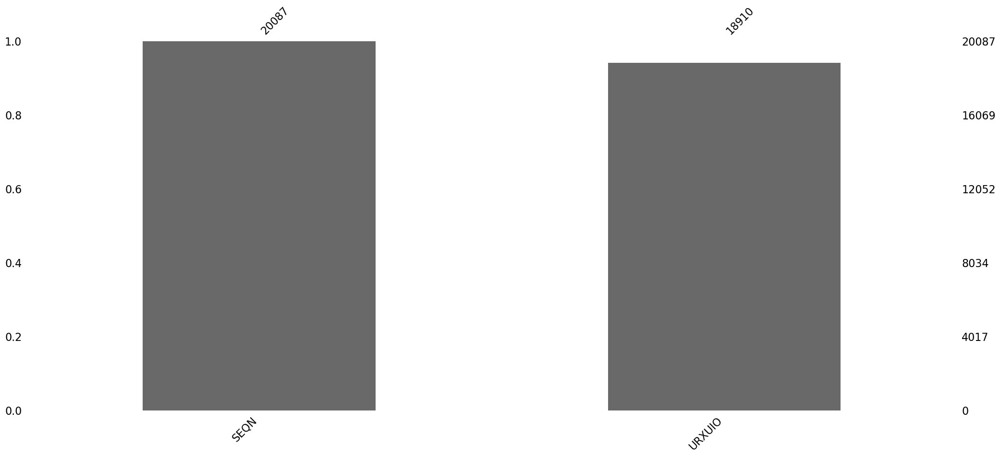

In [322]:
iodine = batch_read('/Users/jnl741/Desktop/NHANES/Lab_values/Iodine')
msno.bar(iodine)

In [323]:
iodine = iodine.rename(columns = {'URXUIO':'Iodine_urine_(ug/L)'})
iodine.columns = iodine.columns.str.replace(' ','_').str.lower()

<AxesSubplot:>

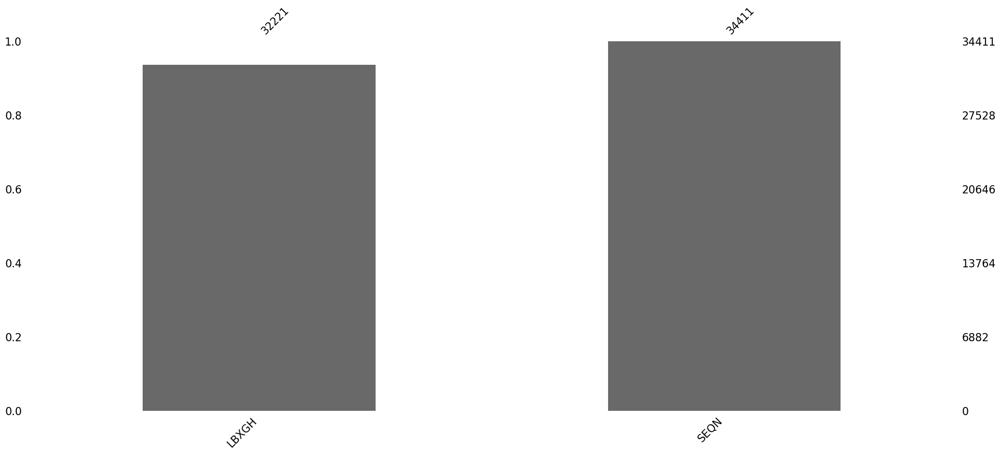

In [324]:
glycohemoglobin = batch_read('/Users/jnl741/Desktop/NHANES/Lab_values/Glycohemoglobin')
msno.bar(glycohemoglobin)

In [325]:
glycohemoglobin = glycohemoglobin.rename(columns = {'LBXGH':'Glycohemoglobin_(%)'})
glycohemoglobin.columns = glycohemoglobin.columns.str.replace(' ','_').str.lower()

<AxesSubplot:>

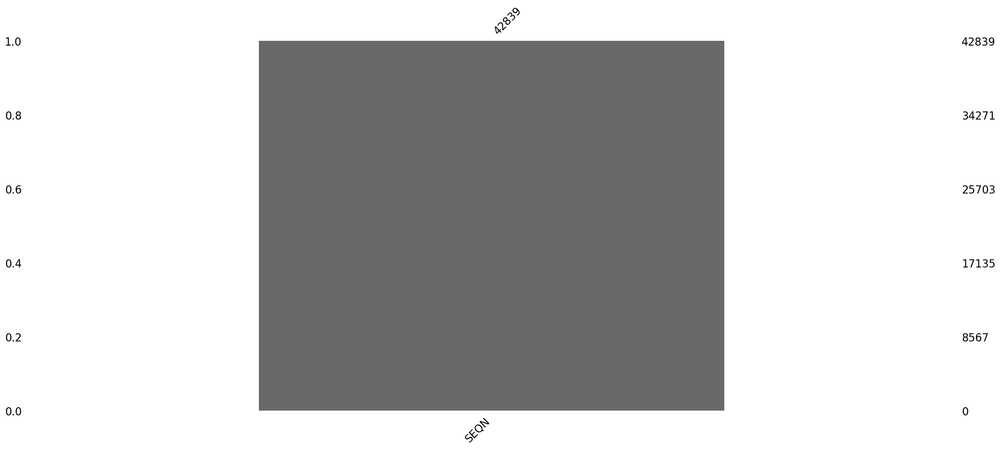

In [326]:
folate_RBCs = batch_read('/Users/jnl741/Desktop/NHANES/Lab_values/Folate_RBC_serum')
msno.bar(folate_RBCs)

In [327]:
folate_0506 = pd.read_sas('/Users/jnl741/Desktop/NHANES/Lab_values/Folate_RBC_serum/FOLATE_D.XPT')
folate_0708 = pd.read_sas('/Users/jnl741/Desktop/NHANES/Lab_values/Folate_RBC_serum/FOLATE_E.XPT')
folate_0910 = pd.read_sas('/Users/jnl741/Desktop/NHANES/Lab_values/Folate_RBC_serum/FOLATE_F.XPT')
folate_1516 = pd.read_sas('/Users/jnl741/Desktop/NHANES/Lab_values/Folate_RBC_serum/FOLATE_I.XPT')
folate_1718 = pd.read_sas('/Users/jnl741/Desktop/NHANES/Lab_values/Folate_RBC_serum/FOLATE_J.XPT')

In [328]:
folate_0506 = folate_0506.rename(columns = {'LBXRBF':'RBC Folate (ng/mL)',
                                            'LBDRBFSI':'RBC Folate (nmol/L)'})
folate_0506 = folate_0506.drop(columns = ['LBXFOL','LBDFOLSI'])

In [329]:
folate_0708 = folate_0708.rename(columns = {'LBDRBF':'RBC Folate (ng/mL)',
                                            'LBXRBFSI':'RBC Folate (nmol/L)'})
folate_0708 = folate_0708.drop(columns = ['LBDFOL','LBXFOLSI'])

In [330]:
folate_0910 = folate_0910.rename(columns = {'LBDRBF':'RBC Folate (ng/mL)',
                                 'LBXRBFSI':'RBC Folate (nmol/L)'})
folate_0910 = folate_0910.drop(columns = ['LBDFOL','LBXFOLSI'])

In [331]:
folate_1516 = folate_1516.rename(columns = {'LBDRFO':'RBC Folate (ng/mL)',
                              'LBDRFOSI':'RBC Folate (nmol/L)'})

In [332]:
folate_1718 = folate_1718.rename(columns = {'LBDRFO':'RBC Folate (ng/mL)',
                              'LBDRFOSI':'RBC Folate (nmol/L)'})
folate_1718 = folate_1718.drop(columns = ['WTFOL2YR'])

In [333]:
folate_master = pd.concat([folate_0506,
                          folate_0708,
                          folate_0910,
                          folate_1516,
                          folate_1718])

folate_master.columns = folate_master.columns.str.replace(' ','_').str.lower().str.lower()

<AxesSubplot:>

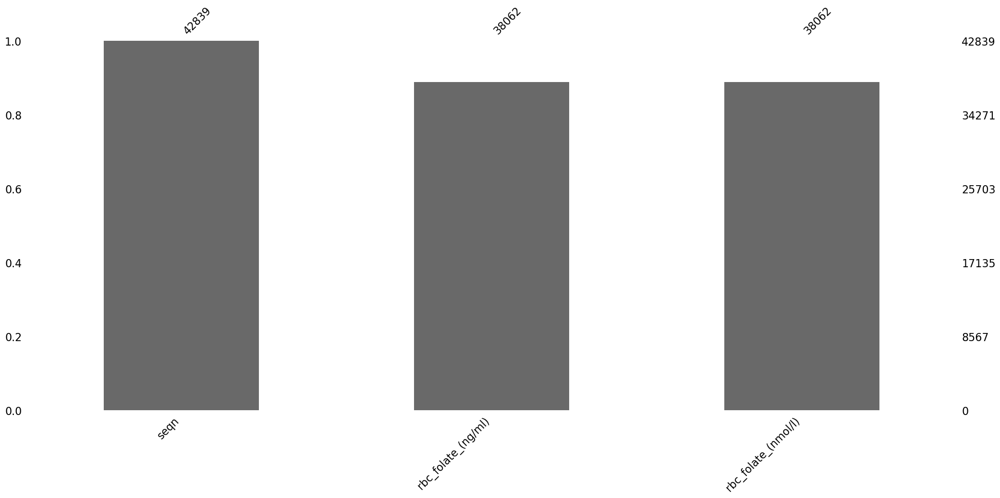

In [334]:
msno.bar(folate_master)

In [335]:
ferritin = batch_read('/Users/jnl741/Desktop/NHANES/Lab_values/Ferritin')


<AxesSubplot:>

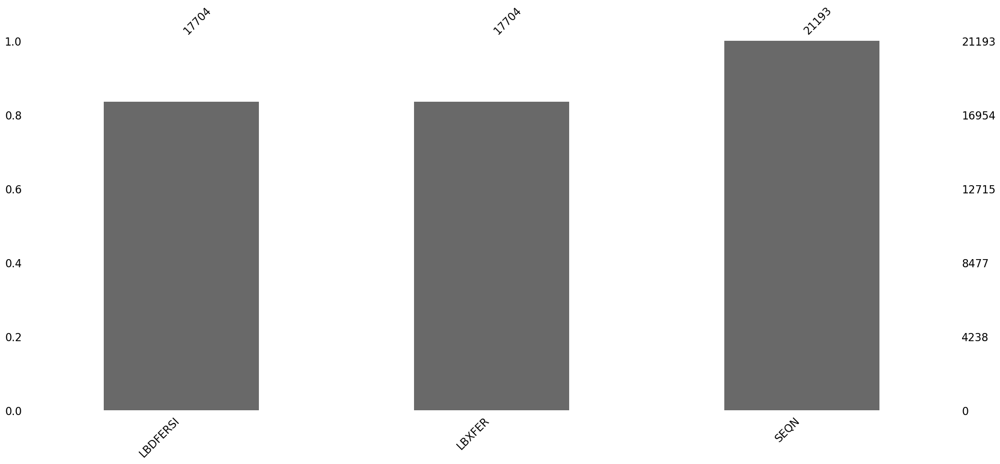

In [336]:
msno.bar(ferritin)

In [340]:
ferritin = ferritin.rename(columns = {'LBXFER':'Ferritin (ng/mL)',
                                      'LBDFERSI':'Ferritin (ug/L)'})
ferritin.columns = ferritin_master.columns.str.replace(' ','_').str.lower().str.lower()

<AxesSubplot:>

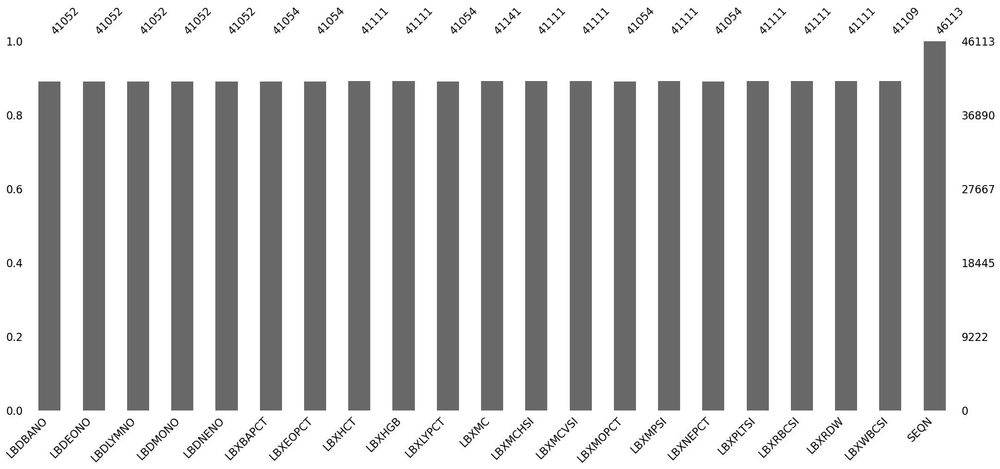

In [338]:
blood_count = batch_read('/Users/jnl741/Desktop/NHANES/Lab_values/Blood_count')
msno.bar(blood_count)

In [339]:
blood_count_new_cols = {
'LBXWBCSI':'White blood cell count (1000 cells/uL)',
'LBXLYPCT':'Lymphocyte percent',
'LBXMOPCT':'Monocyte percent',
'LBXNEPCT':'Segmented neutrophils percent',
'LBXEOPCT':'Eosinophils percent',
'LBXBAPCT':'Basophils percent',
'LBDLYMNO':'Lymphocyte number (1000 cells/uL)',
'LBDMONO':'Monocyte number (1000 cells/uL)',
'LBDNENO':'Segmented neutrophils num (1000 cell/uL)',
'LBDEONO':'Eosinophils number (1000 cells/uL)',
'LBDBANO':'Basophils number (1000 cells/uL)',
'LBXRBCSI':'Red blood cell count (million cells/uL)',
'LBXHGB':'Hemoglobin (g/dL)',
'LBXHCT':'Hematocrit',
'LBXMCVSI':'Mean cell volume (fL)',
'LBXMCHSI':'Mean cell hemoglobin (pg)',
'LBXMC':'MCHC (g/dL)',
'LBXRDW':'Red cell distribution width (%)',
'LBXPLTSI':'Platelet count SI (1000 cells/uL)',
'LBXMPSI':'Mean platelet volume (fL)'
}

In [341]:
blood_count = blood_count.rename(columns = blood_count_new_cols)
blood_count.columns = blood_count.columns.str.replace(' ','_').str.lower()

<AxesSubplot:>

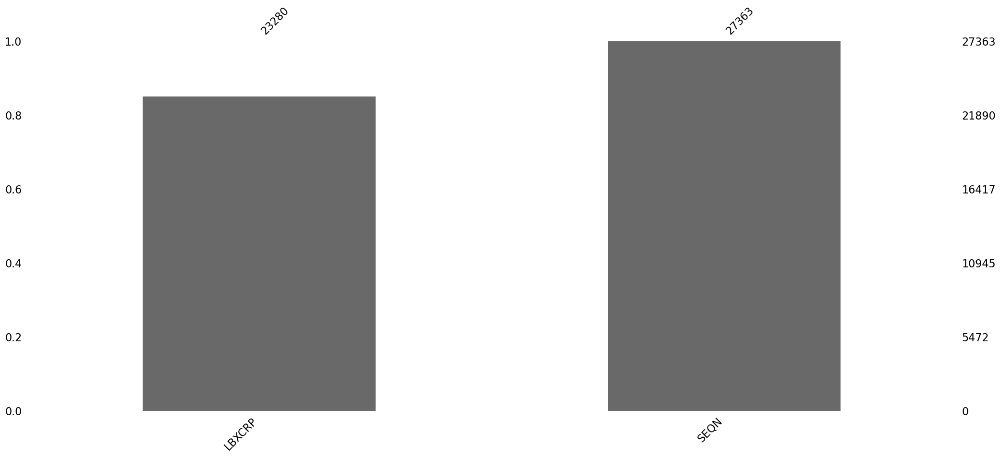

In [342]:
c_reactive = batch_read('/Users/jnl741/Desktop/NHANES/Lab_values/C-reactive_protein')
msno.bar(c_reactive)

In [343]:
c_reactive = c_reactive.rename(columns = {'LBXCRP':'C-reactive_protein(mg/dL)'})

<AxesSubplot:>

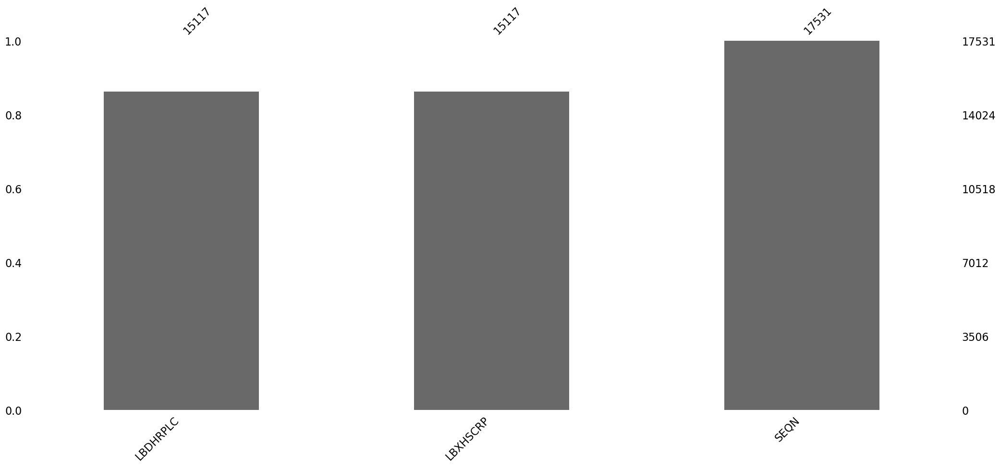

In [344]:
c_reactive_HS = batch_read('/Users/jnl741/Desktop/NHANES/Lab_values/CRP_High_sensitivity')
msno.bar(c_reactive_HS)

In [345]:
c_reactive_HS = c_reactive_HS.rename(columns = {'LBXHSCRP':'C-reactive_protein(mg/dL)'})
c_reactive_HS = c_reactive_HS.drop(columns = ['LBDHRPLC'])

In [164]:
c_reactive_master = pd.concat([c_reactive, c_reactive_HS])
c_reactive_master.shape

(44894, 2)

In [349]:
c_reactive_master.columns = c_reactive_master.columns.str.replace(' ','_').str.lower()

In [363]:
"""Merge the individual dataframes into a master dataframe using an inner join on the 'SEQN' column"""

dfs_to_merge = [depression_screen,
                 demographics,
                 biochem_profile,
                 c_reactive_master,
                 transferrin,
                 blood_count,
                 folate_master,
                 glycohemoglobin,
                 vitamin_d_master]

merged_nhanes = reduce(lambda x,y: pd.merge(x,y, on = 'seqn', how = 'inner'),dfs_to_merge)

In [364]:
"""Check for duplicate rows"""
merged_nhanes.duplicated().sum()

0

In [365]:
merged_nhanes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7465 entries, 0 to 7464
Data columns (total 66 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   have_little_interest_in_doing_things      7465 non-null   float64
 1   feeling_down_depressed_or_hopeless        7465 non-null   float64
 2   sleeping_issues                           7465 non-null   float64
 3   feeling_tired_or_low_energy               7465 non-null   float64
 4   poor_appetite_or_overeating               7465 non-null   float64
 5   feeling_bad_about_self                    7465 non-null   float64
 6   trouble_coencentrating                    7465 non-null   float64
 7   moving_or_speaking_too_slow_or_fast       7465 non-null   float64
 8   thought_you_would_be_better_of_dead       7465 non-null   float64
 9   seqn                                      7465 non-null   float64
 10  phq9_score                          

In [474]:
"""It looks like a lot of rows were dropped during the serial merge. Let's see where the losses are taking place."""

#List of strings to merge with corresponding dfs
dfs_strings = ["depression_screen",
                 "demographics",
                 "biochem_profile",
                 "c_reactive_master",
                 "transferrin",
                 "blood_count",
                 "folate_master",
                 "glycohemoglobin",
                 "vitamin_d_master"]

#Loop to find number of discrepant values between all 2-way combinations of dfs
for combination in combinations({k:v for (k,v) in zip(dfs_strings, dfs_to_merge)}.items(), 
                                r = 2):
    num_different = len(np.setdiff1d(combination[0][1]['seqn'],combination[1][1]['seqn']))
    print(f'the diff between {combination[0][0]} and {combination[1][0]} is {num_different}')

the diff between depression_screen and demographics is 0
the diff between depression_screen and biochem_profile is 0
the diff between depression_screen and c_reactive_master is 10297
the diff between depression_screen and transferrin is 25333
the diff between depression_screen and blood_count is 10297
the diff between depression_screen and folate_master is 12192
the diff between depression_screen and glycohemoglobin is 10297
the diff between depression_screen and vitamin_d_master is 15096
the diff between demographics and biochem_profile is 22251
the diff between demographics and c_reactive_master is 25296
the diff between demographics and transferrin is 48997
the diff between demographics and blood_count is 24077
the diff between demographics and folate_master is 27351
the diff between demographics and glycohemoglobin is 35779
the diff between demographics and vitamin_d_master is 33517
the diff between biochem_profile and c_reactive_master is 13528
the diff between biochem_profile and

Transferrin and glycohemoglobin contain only one variable each, and their inclusion would substantially reduce the size of the composite dataset: let's exclude them. 

In [483]:
dfs_to_merge = [depression_screen,
               biochem_profile,
               c_reactive_master,
               blood_count,
               folate_master,
               vitamin_d_master]

merged_nhanes = reduce(lambda x,y: pd.merge(x,y, on = 'seqn', how = 'inner'),dfs_to_merge)

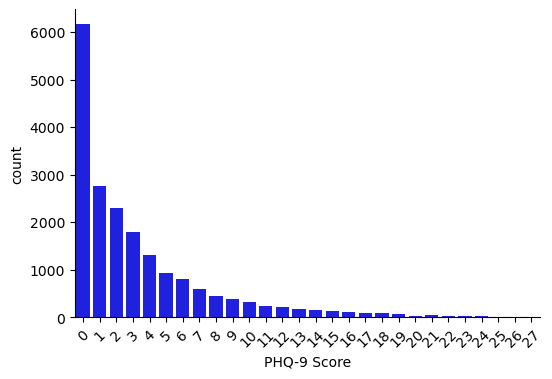

In [485]:
fig, axs = plt.subplots(nrows = 1, ncols = 1, figsize = (6,4))
sns.countplot(x = merged_nhanes['phq9_score'],
        ax = axs, color = 'blue')
x_labels = [i for i in range(0,28,1)]
axs.set_xticklabels(x_labels)
axs.set_xlabel('PHQ-9 Score')
axs.set_title('PHQ-9 Sco')
plt.xticks(rotation = 45)
sns.despine();

In [487]:
merged_nhanes['depression_rating'].value_counts()

Not depressed        14337
Mild                  3176
Moderate               785
Severe                 624
Moderately severe      346
Name: depression_rating, dtype: int64

In [495]:
pd.options.display.max_rows = 100
merged_nhanes.dtypes

have_little_interest_in_doing_things        float64
feeling_down_depressed_or_hopeless          float64
sleeping_issues                             float64
feeling_tired_or_low_energy                 float64
poor_appetite_or_overeating                 float64
feeling_bad_about_self                      float64
trouble_coencentrating                      float64
moving_or_speaking_too_slow_or_fast         float64
thought_you_would_be_better_of_dead         float64
seqn                                        float64
phq9_score                                  float64
depression_rating                            object
blood_urea_nitrogen_(mmol/l)                float64
globulin_(g/l)                              float64
glucose_(mmol/l)                            float64
phosphorus_(mmol/l)                         float64
bilirubin_(umol/l)                          float64
total_protein_(g/l)                         float64
triglycerides_(mmol/l)                      float64
albumin_(g/d

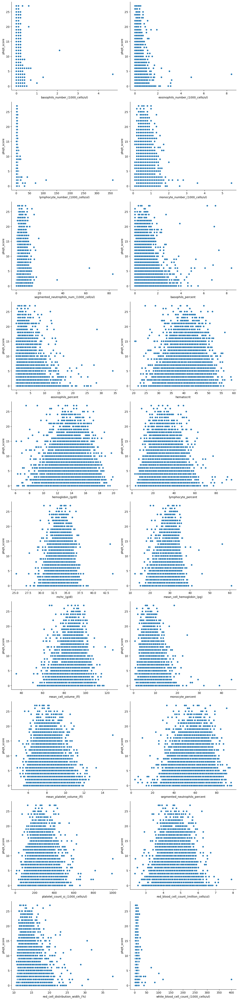

In [792]:
"""Plot blood count variables as function of depression severity"""

fig, axs = plt.subplots(nrows = 10, ncols = 2,figsize = (12,50))

for col, ax in zip(merged_nhanes[blood_count.columns].columns, axs.ravel()):
    sns.scatterplot(x = col, 
                y = merged_nhanes['phq9_score'], 
                  data = merged_nhanes,
                  ax = ax)
    sns.despine()
plt.tight_layout();

In [251]:
# order of x-axis (depresion_rating) variables
order = ['Not depressed','Mild','Moderate','Moderately severe','Severe']

In [247]:
"""Function to identify outliers"""

def find_outliers(df, col, num_std_dev):
    threshold = np.mean(df[col]) + num_std_dev * merged_nhanes[col].std()
    
    return df[df[col] > threshold]

In [248]:
"""Isolate outliers in various blood markers"""
find_outliers(merged_nhanes, 'Basophils_number_(1000_cells/uL)', 4)[blood_count.columns]

,Basophils_number_(1000_cells/uL),Eosinophils_number_(1000_cells/uL),Lymphocyte_number_(1000_cells/uL),Monocyte_number_(1000_cells/uL),Segmented_neutrophils_num_(1000_cell/uL),Basophils_percent,Eosinophils_percent,Hematocrit,Hemoglobin_(g/dL),Lymphocyte_percent,MCHC_(g/dL),Mean_cell_hemoglobin_(pg),Mean_cell_volume_(fL),Monocyte_percent,Mean_platelet_volume_(fL),Segmented_neutrophils_percent,Platelet_count_SI_(1000_cells/uL),Red_blood_cell_count_(million_cells/uL),Red_cell_distribution_width_(%),White_blood_cell_count_(1000_cells/uL),SEQN
5679,0.4,1.000000e-01,1.1,0.2,6.1,4.5,0.8,40.3,14.2,13.8,35.3,31.9,90.4,2.8,7.9,78.2,325.0,4.45,12.5,7.8,52599.0
5784,0.4,3.000000e-01,3.5,0.5,2.2,5.2,4.3,29.5,9.8,50.7,33.3,27.0,81.1,7.7,8.1,32.2,234.0,3.63,16.0,6.9,52801.0
6002,0.7,4.000000e-01,4.0,1.1,4.0,6.7,4.4,45.4,15.4,39.2,33.9,30.8,90.7,10.5,8.5,39.2,258.0,5.01,13.7,10.1,53269.0
7861,0.4,2.000000e-01,15.4,0.7,5.4,1.6,0.7,35.2,12.4,69.9,35.0,32.3,92.1,3.3,6.5,24.5,137.0,3.82,14.0,22.0,56804.0
7939,0.5,2.000000e-01,1.2,0.4,9.7,4.0,1.6,51.2,18.2,10.1,35.5,31.9,89.7,3.3,9.2,81.0,216.0,5.70,12.2,12.0,56944.0
8552,1.3,2.000000e-01,17.3,1.2,17.3,3.6,0.6,46.7,16.2,46.3,34.8,32.6,93.9,3.3,7.9,46.3,164.0,4.97,12.9,37.4,58095.0
8796,0.4,1.500000e+00,1.3,0.2,4.4,4.9,19.5,36.4,11.5,17.0,31.7,27.5,86.9,2.3,10.6,56.3,124.0,4.19,20.7,7.8,58574.0
8916,0.5,5.397605e-79,2.7,0.6,2.3,8.4,0.4,42.2,14.4,44.7,34.1,30.5,89.3,9.3,7.4,37.1,292.0,4.73,14.3,6.1,58775.0
9177,0.4,2.000000e-01,2.1,0.5,4.5,5.3,2.2,42.4,14.7,27.0,34.6,32.3,93.2,6.4,8.2,59.1,295.0,4.55,11.5,7.6,59273.0
9623,0.4,4.000000e-01,3.3,0.3,6.8,3.6,3.5,46.7,15.4,29.7,32.8,28.3,85.9,2.3,8.4,60.9,204.0,5.43,12.3,11.2,60098.0


In [77]:
pd.options.display.max_columns = 100
find_outliers(merged_nhanes, 'Lymphocyte_number_(1000_cells/uL)', 1)[blood_count.columns]

,Basophils_number_(1000_cells/uL),Eosinophils_number_(1000_cells/uL),Lymphocyte_number_(1000_cells/uL),Monocyte_number_(1000_cells/uL),Segmented_neutrophils_num_(1000_cell/uL),Basophils_percent,Eosinophils_percent,Hematocrit,Hemoglobin_(g/dL),Lymphocyte_percent,MCHC_(g/dL),Mean_cell_hemoglobin_(pg),Mean_cell_volume_(fL),Monocyte_percent,Mean_platelet_volume_(fL),Segmented_neutrophils_percent,Platelet_count_SI_(1000_cells/uL),Red_blood_cell_count_(million_cells/uL),Red_cell_distribution_width_(%),White_blood_cell_count_(1000_cells/uL),SEQN
1337,0.1,0.2,6.6,0.8,11.3,0.4,0.9,40.3,13.5,34.9,33.3,30.0,90.0,4.2,8.8,59.7,386.0,4.48,12.4,19.0,93274.0
3962,2.1,0.3,8.0,1.7,16.6,7.3,1.0,38.4,12.5,28.0,32.6,23.9,73.4,5.9,7.9,57.8,101.0,5.31,16.3,28.7,49314.0
6074,0.1,0.5,10.6,0.7,3.9,0.4,3.2,37.1,12.7,67.3,34.4,31.0,90.3,4.4,7.7,24.9,401.0,4.10,13.3,15.8,98840.0
7285,0.4,3.2,358.8,2.8,35.2,0.1,0.8,30.4,9.0,89.7,29.6,25.5,86.3,0.7,8.0,8.8,240.0,3.52,15.9,400.0,102389.0


In [78]:
find_outliers(merged_nhanes, 'White_blood_cell_count_(1000_cells/uL)', 3)[blood_count.columns]

,Basophils_number_(1000_cells/uL),Eosinophils_number_(1000_cells/uL),Lymphocyte_number_(1000_cells/uL),Monocyte_number_(1000_cells/uL),Segmented_neutrophils_num_(1000_cell/uL),Basophils_percent,Eosinophils_percent,Hematocrit,Hemoglobin_(g/dL),Lymphocyte_percent,MCHC_(g/dL),Mean_cell_hemoglobin_(pg),Mean_cell_volume_(fL),Monocyte_percent,Mean_platelet_volume_(fL),Segmented_neutrophils_percent,Platelet_count_SI_(1000_cells/uL),Red_blood_cell_count_(million_cells/uL),Red_cell_distribution_width_(%),White_blood_cell_count_(1000_cells/uL),SEQN
3962,2.1,0.3,8.0,1.7,16.6,7.3,1.0,38.4,12.5,28.0,32.6,23.9,73.4,5.9,7.9,57.8,101.0,5.31,16.3,28.7,49314.0
7285,0.4,3.2,358.8,2.8,35.2,0.1,0.8,30.4,9.0,89.7,29.6,25.5,86.3,0.7,8.0,8.8,240.0,3.52,15.9,400.0,102389.0


The outliers in individual categories (white blood cell count, basophils count, etc) correspond with abnormally high
levels of other cell types. We will therefore leave them in the dataset.

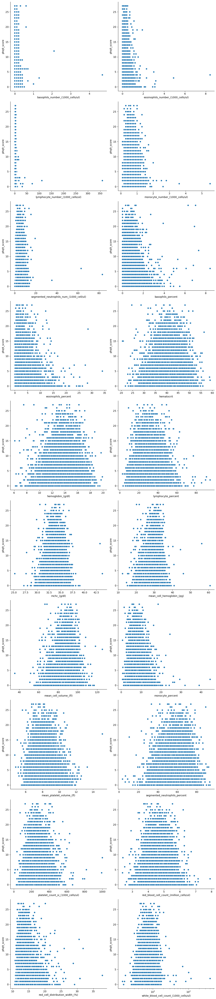

In [708]:
"""Plot blood count variables again but without points above 3 SD to avoid compression. """

fig, axs = plt.subplots(nrows = 10, ncols = 2,figsize = (12,55))

for col, ax in zip(merged_nhanes[blood_count.columns].columns, axs.ravel()):
    sns.scatterplot(x = col, 
                y = merged_nhanes['phq9_score'], 
                  data = merged_nhanes,
                  ax = ax)
    #x_lim = np.mean(merged_nhanes[col]) + 3*merged_nhanes[col].std()
    #ax.set_xlim(0, x_lim)
    plt.xscale('log')
    sns.despine()
plt.tight_layout();


Looks like the folowing are positively correlated with depression rating:
1. white blood cell count. this includes lymphocytes( T cells, B cells, NK cells), neutrophils, eosinophils and basophils
2. platelet count
4. segmented neutrophils count. neutrophils are type of wbc. this count is included in the wbc count (1)

And the following appear to be negatively correlated with depression rating:
1. monocyte percent. monocytes are precursors of dendritic cells and macrophages
2. red blood cell count
3. hemoglobin- which makes sense, as red blood cells carry hemoglobin
4. MCHC-the mean concentration of hemoglobin within a red blood cell
5. lymphocyte percent. This is the percent of T cells, B cells, and NK cells in the blood


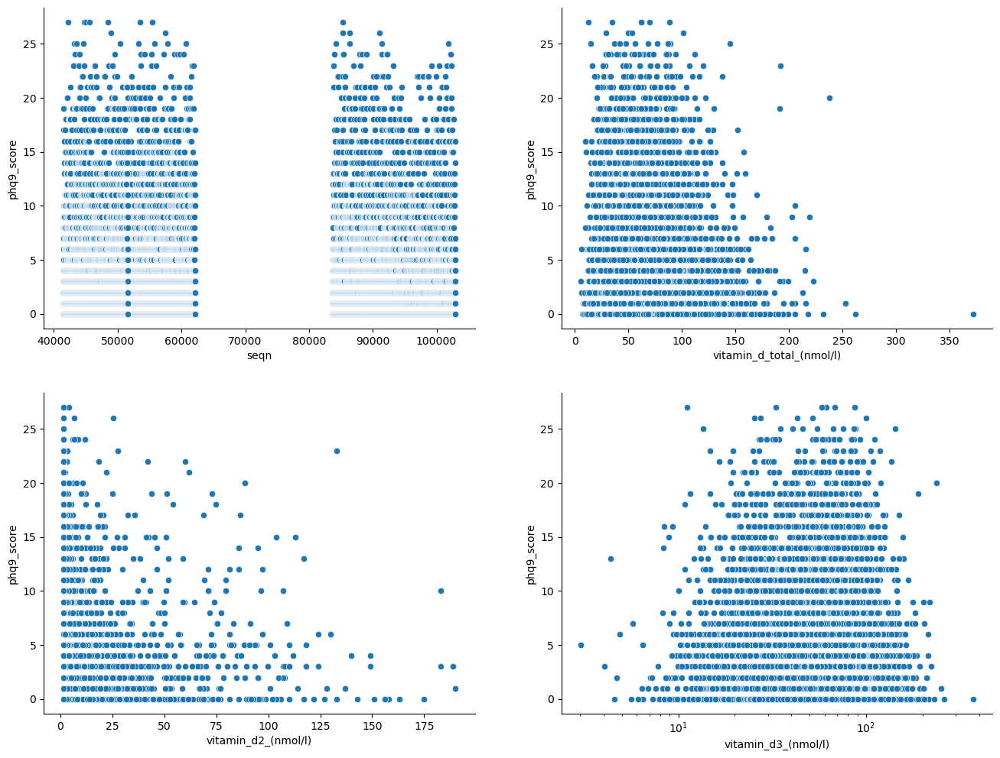

In [711]:
"""Plot vitamin D levels as function of depression severity"""

fig, axs = plt.subplots(nrows = 2, ncols = 2,figsize = (16,12))

for col, ax in zip(merged_nhanes[vitamin_d_master.columns[vitamin_d_master.columns != 'SEQN']], axs.ravel()):
    sns.scatterplot(x = col, 
                y = merged_nhanes['phq9_score'], 
                  data = merged_nhanes,
                  ax = ax )
    plt.xscale('log')
    sns.despine();

Vitamin D3 is negatively correlated with depression rating. Total vitamin D,which is looks to be largely determined by D3 levels, also is negatively correlated with depression rating. 


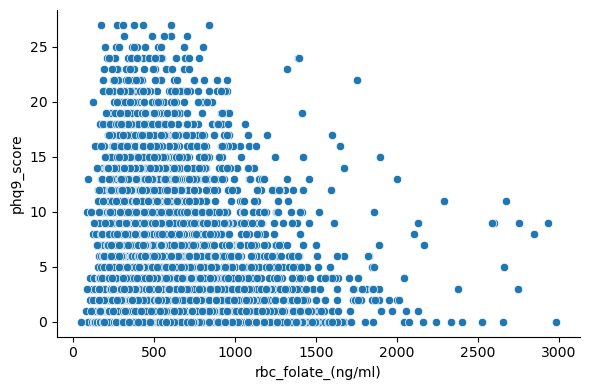

In [746]:
"""Folate as function of depression rating"""
fig, ax = plt.subplots(nrows = 1, ncols = 1,figsize = (6,4))

sns.scatterplot(x = 'rbc_folate_(ng/ml)', 
            y = 'phq9_score', 
            data = merged_nhanes,
            ax = ax)
sns.despine()
plt.tight_layout()

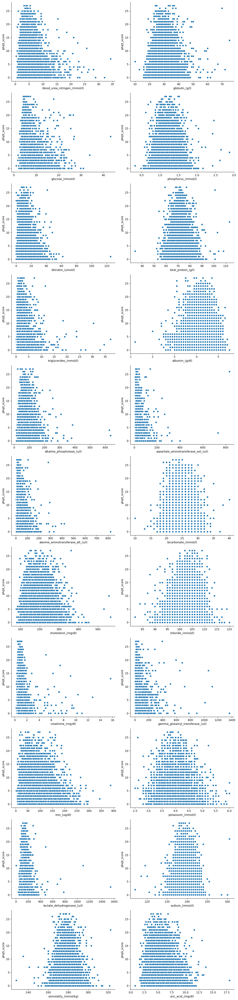

In [753]:
"""Biochemical markers as function of depression rating"""
fig, axs = plt.subplots(nrows = 11, ncols = 2,figsize = (12,50))

for col, ax in zip(merged_nhanes[biochem_profile.columns], axs.ravel()):
    sns.scatterplot(x = col, 
                y = merged_nhanes['phq9_score'], 
                data = merged_nhanes,
                ax = ax)
    sns.despine()
    
plt.tight_layout()

The following appear to be positively correlated with depression score:
1. albumin
2. alkaline phosphatase
3. gamma glutamyl transerfase
4. triglycerides


And the following negatively correlated with depression score:
1. Iron
2. Creatinine
3. lactate dehydrogenase
4. blood urea nitrogen

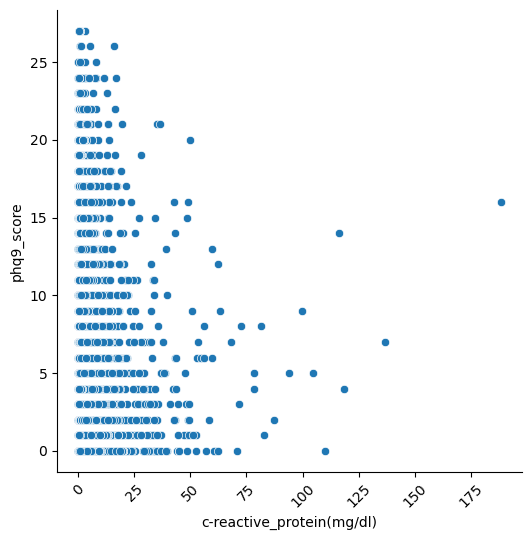

In [756]:
fig, axs = plt.subplots(nrows = 1, ncols = 1,figsize = (6,6))
sns.scatterplot(x = 'c-reactive_protein(mg/dl)', 
            y = merged_nhanes['phq9_score'], 
                  data = merged_nhanes)
#Restrict outliers to w/in 2 SD to avoid compression

plt.xticks(rotation = 45)
sns.despine()

<AxesSubplot:>

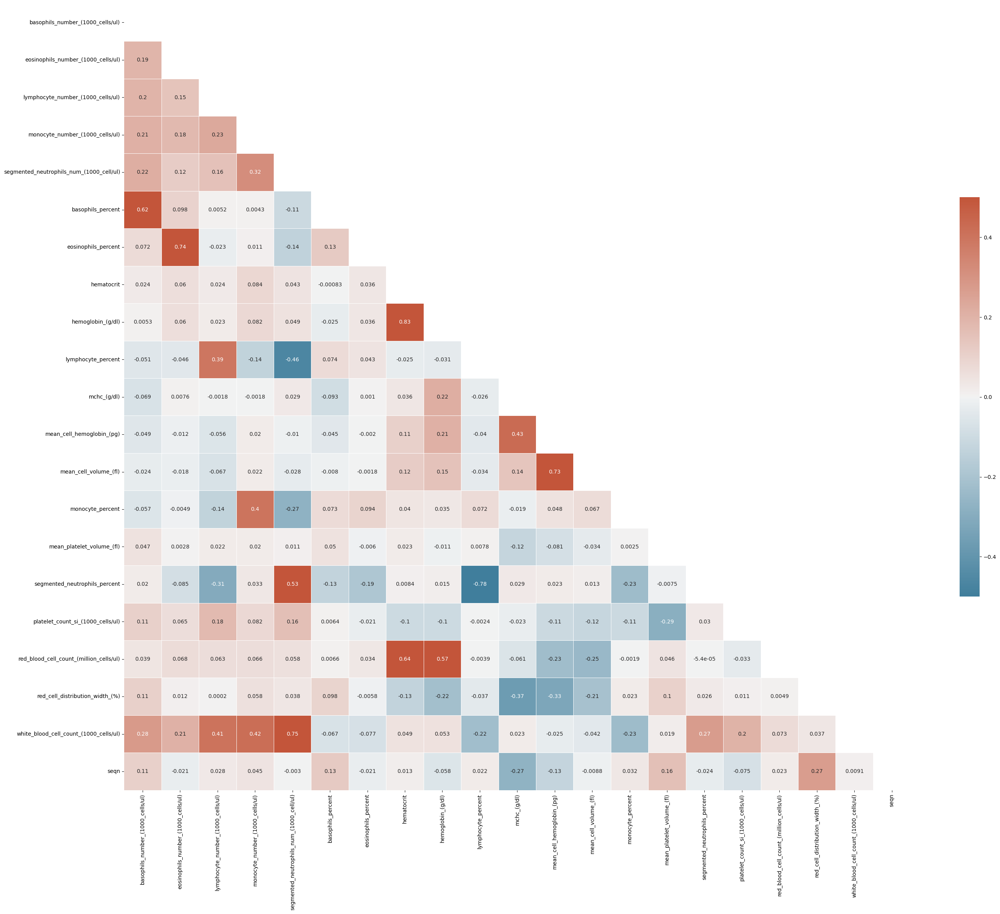

In [496]:
"""Heatmap to visualize correlations between blood markers. To allow for nonlinear relationships between variables, 
we will use the non-parametric Kendall's tau instead of the Pearson correlation coefficient."""

blood_count_corrs = merged_nhanes[blood_count.columns].corr(method = 'kendall') 
mask = np.triu(np.ones_like(blood_count_corrs, dtype = bool))

#create a colormap, blue for negative correlations, red for positive
cmap = sns.diverging_palette(230, 20, as_cmap=True)

fig, axes = plt.subplots(figsize = (33,27))
sns.heatmap(blood_count_corrs,
            mask = mask, 
            vmax = 0.5,
            vmin = -0.5,
            center = 0, 
            square = True, 
            linewidths = 0.5, 
            cmap = cmap,
            annot = True,
            cbar_kws = {'shrink':0.5})

There are variables, such as lymphocyte number/percent, white blood cell number/percent, which are composites of other variables, such as basophil number, eosinophil number, etc. We should delete these to avoid feeding redudant information to our model.

1. Eosinophils_percent, segmented neutrophils percent, basophils percent, lymphocyte percent, monocyte percent. 
2. White_blood_cell_count_(1000_cells/uL) and percent. We will instead include the constituent values in the first pass of the model
3. Hematocrit: this is redundant with rbc count,etc.  


<AxesSubplot:>

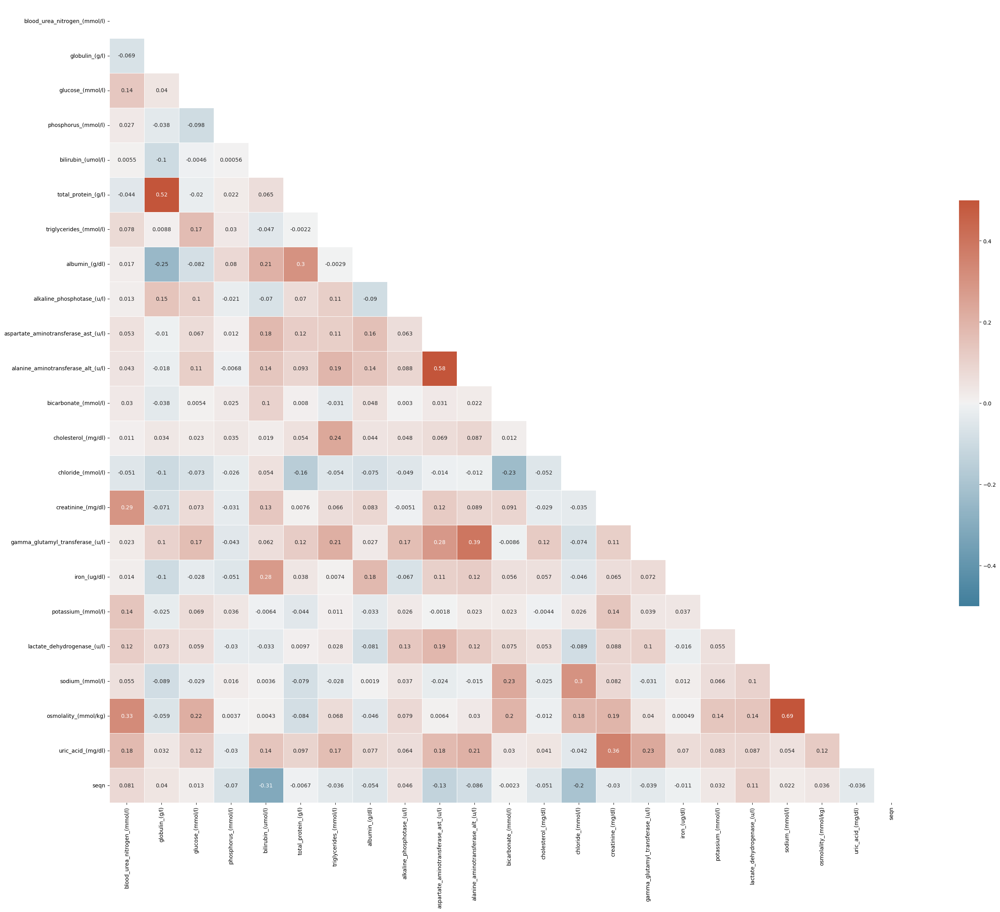

In [503]:
biochem_corrs = merged_nhanes[biochem_profile.columns].corr(method = 'kendall')
mask = np.triu(np.ones_like(biochem_corrs, dtype = bool))

#create a colormap, blue for negative correlations, red for positive
cmap = sns.diverging_palette(230, 20, as_cmap=True)

fig, axes = plt.subplots(figsize = (33,27))
sns.heatmap(biochem_corrs,
            mask = mask, 
            vmax = 0.5,
            vmin = -0.5,
            center = 0, 
            square = True, 
            linewidths = 0.5, 
            cmap = cmap,
            annot = True,
            cbar_kws = {'shrink':0.5})

Features to drop based on collinearity/redundancy:

1. Osmolality
2. total protein
3. alanine or aspartate aminotransferase

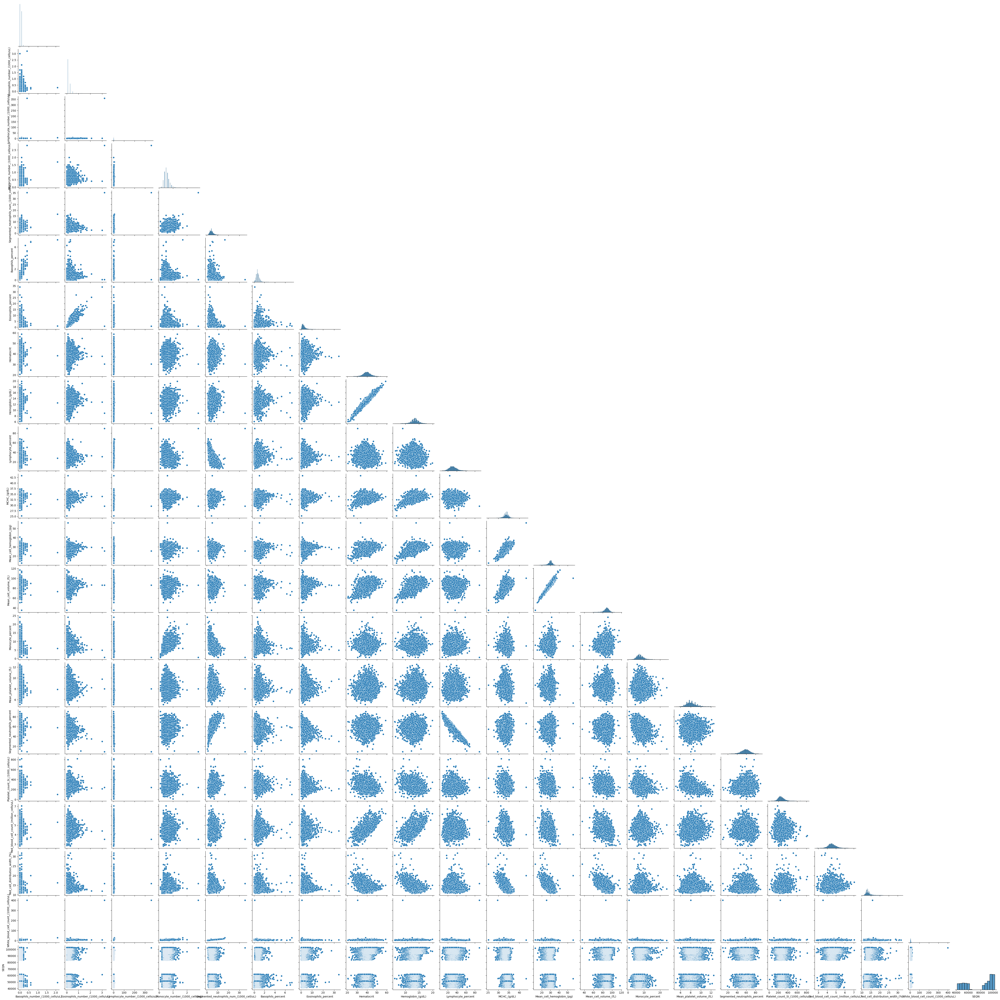

In [89]:
sns.pairplot(data = merged_nhanes[blood_count.columns],corner = True)

In [497]:
merged_nhanes.shape

(19268, 61)

<AxesSubplot:>

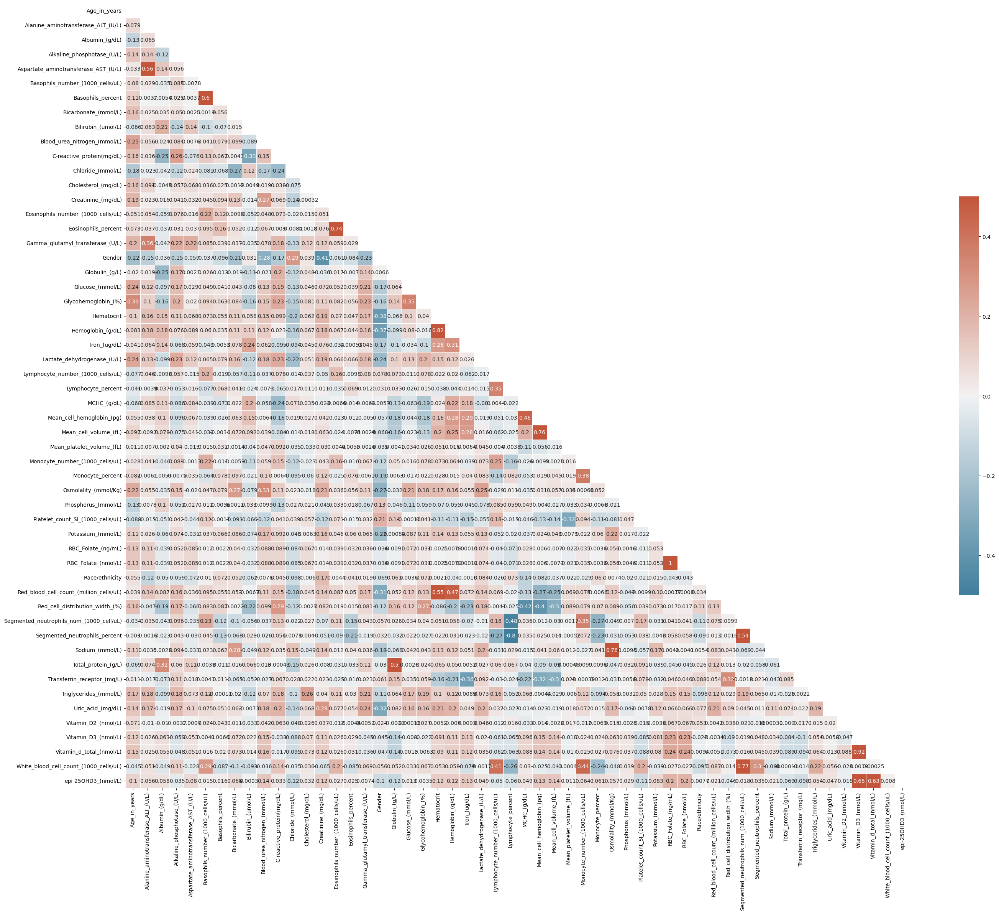

In [90]:
"""Correlation heatmap for all lab values"""

corrs = merged_nhanes[np.setdiff1d(merged_nhanes.columns, depression_screen.columns)].corr( method = 'kendall')

mask = np.triu(np.ones_like(corrs, dtype = bool))

#create a colormap, blue for negative correlations, red for positive
cmap = sns.diverging_palette(230, 20, as_cmap=True)

fig, axes = plt.subplots(figsize = (33,27))
sns.heatmap(corrs,
            mask = mask, 
            vmax = 0.5,
            vmin = -0.5,
            center = 0, 
            square = True, 
            linewidths = 0.5, 
            cmap = cmap,
            annot = True,
            cbar_kws = {'shrink':0.5});

In [ ]:
correlations = merged_nhanes[['platelet_count_si_(1000_cells/ul)',
 'red_blood_cell_count_(million_cells/ul)',
 'red_cell_distribution_width_(%)',
 'white_blood_cell_count_(1000_cells/ul)',
 'segmented_neutrophils_num_(1000_cell/ul)',
 'monocyte_percent',
 'hemoglobin_(g/dl)',
 'mchc_(g/dl)',
 'lymphocyte_percent',
 'albumin_(g/dl)',
 'alkaline_phosphotase_(u/l)',
 'gamma_glutamyl_transferase_(u/l)',
 'triglycerides_(mmol/l)',
 'iron_(ug/dl)',
 'creatinine_(mg/dl)',
 'lactate_dehydrogenase_(u/l)',
 'blood_urea_nitrogen_(mmol/l)',
 'vitamin_d3_(nmol/l)', 
 'epi-25ohd3_(nmol/l)']].corrwith(merged_nhanes['phq9_score'], method = 'kendall')

correlations

In [ ]:
"""Strip parenthetic strings, underscores, and extraneous whitespace from column names"""
cols_for_plotting = []
for col in correlations.index:
    col = re.sub("[\(\[].*?[\)\]]", "", col).replace('_',' ').strip()
    cols_for_plotting.append(col)

/var/folders/v9/483tmlvj28ldt2s2wvphywvxd4j0g_/T/ipykernel_22944/2668036884.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs.set_xticklabels(cols_for_plotting)


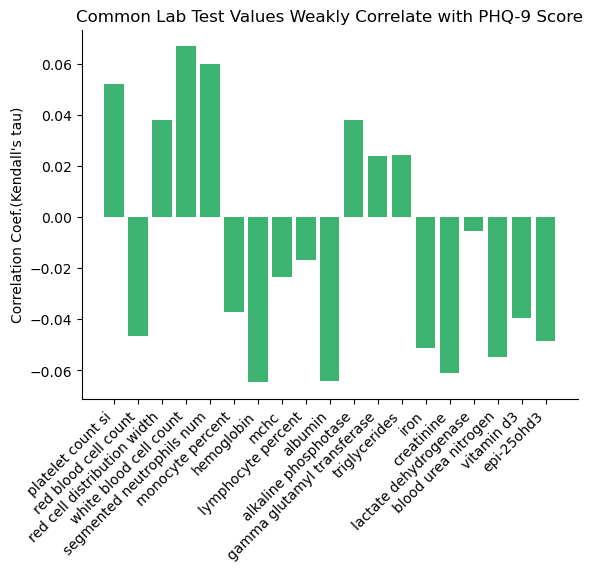

In [793]:
"""Bar plot of correlations with PHQ-9 score"""

fig, axs = plt.subplots()

axs.bar( x = correlations.index, height = correlations.values, color = 'mediumseagreen')
plt.xticks(rotation = 45, ha = 'right')
axs.set_xticklabels(cols_for_plotting)
axs.set_ylabel("Correlation Coef.(Kendall's tau)")
axs.set_title('Common Lab Test Values Weakly Correlate with PHQ-9 Score')
sns.despine()

"""Let's run the model with all missing values imputed. To do so, we will use the MissForest imputation algorithm from
the missingpy package. MissForest uses the random forest algorithm to regress/classify each column with the other
columns in the dataset. """

In [504]:
"""Remove mental health info to prevent data leakage"""
merged_nhanes_for_imputation = merged_nhanes.drop(columns = depression_screen.columns[depression_screen.columns != 'SEQN'],
                                                   axis = 1)


In [505]:
"""Run MissForest imputer"""

imputer = MissForest()
merged_nhanes_imputed = imputer.fit_transform(merged_nhanes_for_imputation)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, ex

Iteration: 0


/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, ex

Iteration: 1


/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, ex

Iteration: 2


/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, ex

Iteration: 3


In [506]:
merged_nhanes_imputed = pd.DataFrame(merged_nhanes_imputed,
                                  columns = merged_nhanes_for_imputation.columns)
merged_nhanes_imputed.isnull().sum()

blood_urea_nitrogen_(mmol/l)                0
globulin_(g/l)                              0
glucose_(mmol/l)                            0
phosphorus_(mmol/l)                         0
bilirubin_(umol/l)                          0
total_protein_(g/l)                         0
triglycerides_(mmol/l)                      0
albumin_(g/dl)                              0
alkaline_phosphotase_(u/l)                  0
aspartate_aminotransferase_ast_(u/l)        0
alanine_aminotransferase_alt_(u/l)          0
bicarbonate_(mmol/l)                        0
cholesterol_(mg/dl)                         0
chloride_(mmol/l)                           0
creatinine_(mg/dl)                          0
gamma_glutamyl_transferase_(u/l)            0
iron_(ug/dl)                                0
potassium_(mmol/l)                          0
lactate_dehydrogenase_(u/l)                 0
sodium_(mmol/l)                             0
osmolality_(mmol/kg)                        0
uric_acid_(mg/dl)                 

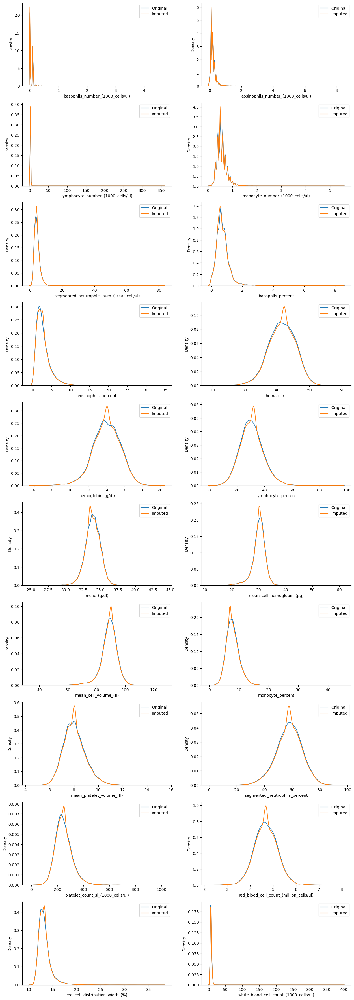

In [507]:
"""Distribution plots to assess imputer performance"""

fig,axs = plt.subplots(nrows = 10, ncols = 2, figsize = (15,45))
for col, ax in zip(blood_count.columns[blood_count.columns != 'SEQN'], axs.ravel()):
    sns.kdeplot(x = col, 
                  data = merged_nhanes,
                  ax = ax,
                label = 'Original')
    sns.kdeplot(x = col, 
                  data = merged_nhanes_imputed,
                  ax = ax,
                label = 'Imputed')
    ax.legend()
    sns.despine()

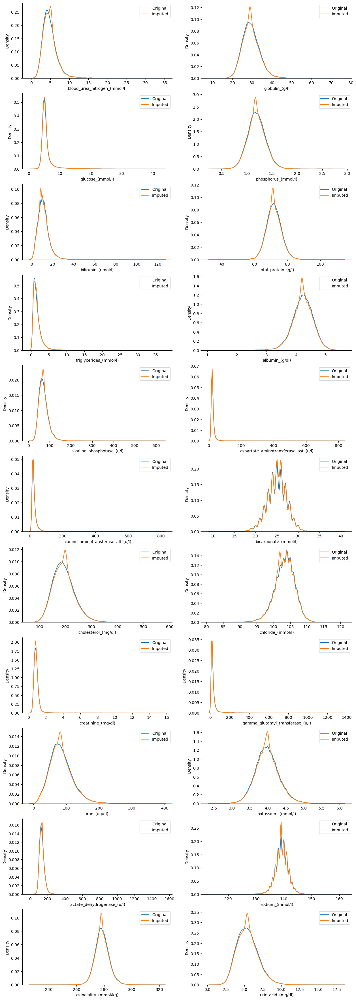

In [511]:
"""Distribution plots to assess imputer performance"""

fig,axs = plt.subplots(nrows = 11, ncols = 2, figsize = (15,45))
for col, ax in zip(biochem_profile.columns[biochem_profile.columns != 'seqn'], axs.ravel()):
    sns.kdeplot(x = col, 
                  data = merged_nhanes,
                  ax = ax,
                label = 'Original')
    sns.kdeplot(x = col, 
                  data = merged_nhanes_imputed,
                  ax = ax,
                label = 'Imputed')
    ax.legend()
    sns.despine()

Overall, the MissForest imputer preserved to general shape of each variable's distrution. It did sharpen the peaks (mode) and narrow the distributions.

In [667]:
df_for_modeling = merged_nhanes_imputed.drop(columns = ['eosinophils_percent', 
                                                        'segmented_neutrophils_percent', 
                                                        'basophils_percent', 
                                                        'lymphocyte_percent', 
                                                        'monocyte_number_(1000_cells/ul)',
                                                        'osmolality_(mmol/kg)',
                                                        'total_protein_(g/l)',
                                                        'white_blood_cell_count_(1000_cells/ul)',
                                                        'vitamin_d_total_(nmol/l)',
                                                        'hematocrit'])
# add phq9 column to df
df_for_modeling = pd.concat(objs = [df_for_modeling, merged_nhanes['phq9_score']], 
                            axis = 1)

In [669]:
"""Create train-test split"""

X = df_for_modeling.loc[:, df_for_modeling.columns != 'phq9_score']
y = df_for_modeling['phq9_score']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=42)

In [670]:
# Instantiate rf
rf = RandomForestRegressor(n_estimators = 50,
            random_state = 1)

In [671]:
# Fit rf to the training set using sklearn's default parameters. 
rf.fit(X_train, y_train) 

RandomForestRegressor(n_estimators=50, random_state=1)

In [672]:

# Predict the test set labels
y_pred = rf.predict(X_test)
# Evaluate the test set RMSE
rmse_test_full_model = MSE(y_test,y_pred)**0.5
# Print rmse_test
print('Test set RMSE of rf: {:.2f}'.format(rmse_test)) 

Test set RMSE of rf: 4.29


In [674]:
from sklearn.metrics import r2_score

# Rsquared Score for RandomForest
full_model_r2 = r2_score(y_test, y_pred)

In [562]:


rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 1.0,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 50,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 1,
 'verbose': 0,
 'warm_start': False}

In [677]:
#Define dictionary of parameter ranges for optimization

params_rf = {'n_estimators':[100,300,500],
             'max_features':['log2', 'auto', 'sqrt'],
             'min_samples_leaf':[2, 10, 30],
             'max_depth': [10, 20, 40, 60, 80, None]}

In [678]:
# Instantiate grid_rf
grid_rf_full_model = GridSearchCV(estimator = rf,
                       param_grid = params_rf,
                       scoring = 'neg_mean_squared_error',
                       cv = 3,
                       verbose = 1,
                       n_jobs = -1)

In [584]:
grid_rf_full_model.best_params_

{'max_depth': 20,
 'max_features': 'auto',
 'min_samples_leaf': 30,
 'n_estimators': 100}

In [679]:
grid_rf_full_model.fit(X_train, y_train)

Fitting 3 folds for each of 162 candidates, totalling 486 fits


/opt/anaconda3/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


GridSearchCV(cv=3,
             estimator=RandomForestRegressor(n_estimators=50, random_state=1),
             n_jobs=-1,
             param_grid={'max_depth': [10, 20, 40, 60, 80, None],
                         'max_features': ['log2', 'auto', 'sqrt'],
                         'min_samples_leaf': [2, 10, 30],
                         'n_estimators': [100, 300, 500]},
             scoring='neg_mean_squared_error', verbose=1)

In [680]:
# Extract the best estimator
best_full_model = grid_rf_full_model.best_estimator_

# Predict test set labels
y_pred = best_full_model.predict(X_test)

# Compute rmse_test
rmse_test_best_full_model = MSE(y_test, y_pred)**(1/2)

# Print rmse_test
print('Test RMSE of the best model: {:.3f}'.format(rmse_test_best_full_model)) 

Test RMSE of the best model: 4.198


In [681]:
from sklearn.metrics import r2_score

# Rsquared Score for RandomForest
r2_score(y_test, y_pred)

0.0502976744430097

In [686]:
# Extract the best estimator
best_full_model = grid_rf_full_model.best_estimator_

# Predict test set labels
y_pred = y_test - merged_nhanes['phq9_score'].median()

# Compute rmse_test
rmse_median = MSE(y_test, y_pred)**(1/2)

# Print rmse_test
print('Test RMSE of the baseline model: {:.3f}'.format(rmse_median)) 

Test RMSE of the baseline model: 2.000


In [687]:


# Rsquared Score for RandomForest
r2_score(y_test, y_pred)

0.7844182243045675